In [1]:
# Import necessary libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import scipy.stats as stats
import os
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
linreg = LinearRegression()
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
import pygeohash as gh # can be installed with !pip install pygeohash
from pandasql import sqldf
pysqldf = lambda q: sqldf(q, globals())
import sys

geoprecision = 4

In [2]:
# Import and inspect data

try:
    os.chdir('./data')
except:
    pass

init_data = pd.read_csv('kc_house_data.csv')
os.chdir('./')

display(init_data.head())
display(init_data.describe())
init_data.info()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,19221.000000,21534.000000,21597.000000,21597.000000,21597.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.007596,0.233863,3.409825,7.657915,1788.596842,1970.999676,83.636778,98077.951845,47.560093,-122.213982,1986.620318,12758.283512
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.086825,0.765686,0.650546,1.173200,827.759761,29.375234,399.946414,53.513072,0.138552,0.140724,685.230472,27274.441950
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(11), object(2)
memory usage: 3.5+ MB


In [3]:
# Check for nan values

for column in init_data.columns:
    nan_total = init_data[column].isna().sum()
    if nan_total > 0:
        print(f'''{column} has {nan_total} nan values in it, accounting for {round(100*nan_total/init_data.shape[0], 2)}% of that feature.''')
    else:
        continue

waterfront has 2376 nan values in it, accounting for 11.0% of that feature.
view has 63 nan values in it, accounting for 0.29% of that feature.
yr_renovated has 3842 nan values in it, accounting for 17.79% of that feature.


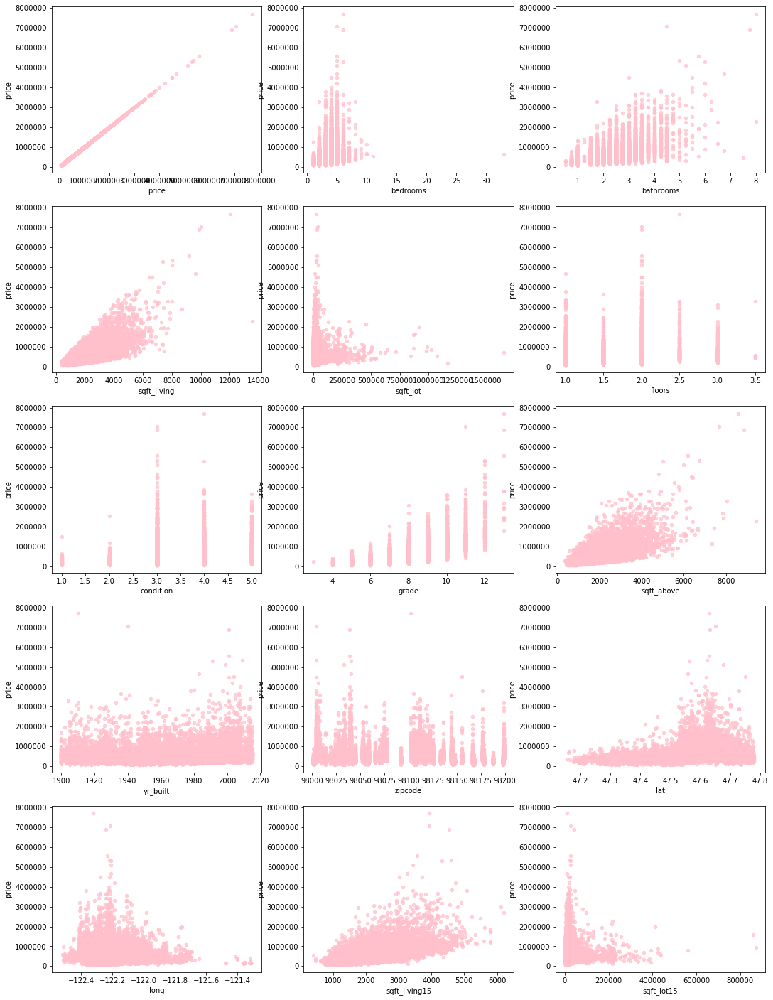

In [4]:
# Visually inspect data after dropping problem/extra columns

init_data.drop(['id',
                'date',
                'waterfront',
                'view',
                'yr_renovated',
                'sqft_basement'], axis=1, inplace=True)

fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(18,25))

for xcol, ax in zip(init_data.columns, axes.flatten()):
    init_data.plot(kind='scatter', x=xcol, y='price', ax=ax, alpha=0.7, color='pink')

In [5]:
# transform lattitude and longitude into geohash values, then drop them, as well as zipcode

init_data['geohash'] = init_data.apply(lambda x: gh.encode(x.lat,
                                                           x.long,
                                                           precision=geoprecision), axis=1)

init_data.drop(['lat', 'long', 'zipcode'], axis=1, inplace=True)

In [6]:
# List the continuous and the categorical values

cont = ['sqft_living',
       'sqft_lot',
       'sqft_above',
       'sqft_living15',
       'sqft_lot15']
cat = ['bedrooms',
      'bathrooms',
      'floors',
      'condition',
      'grade',
      'yr_built'
#       'geohash'
      ]

In [7]:
# Identify and deal with outliers, create a new DF

display(init_data.loc[init_data['bedrooms'] == init_data['bedrooms'].max()])
for column in cont:
    print(column.upper())
    print('----------------------------------------------')
    print(list(init_data[column].nsmallest(10).value_counts().index))
    print(list(init_data[column].nlargest(10).value_counts().index))
    print('----------------------------------------------')

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,yr_built,sqft_living15,sqft_lot15,geohash
15856,640000.0,33,1.75,1620,6000,1.0,5,7,1040,1947,1330,4700,c23p


SQFT_LIVING
----------------------------------------------
[420, 430, 380, 410, 440, 390, 460, 370, 470]
[8020, 8670, 9640, 8010, 8000, 10040, 9890, 13540, 12050, 9200]
----------------------------------------------
SQFT_LOT
----------------------------------------------
[649, 638, 572, 635, 520, 651, 600, 609, 675]
[871200, 1651359, 1024068, 920423, 1164794, 982278, 982998, 881654, 1074218]
----------------------------------------------
SQFT_ABOVE
----------------------------------------------
[420, 430, 380, 410, 440, 390, 460, 370, 470]
[7850, 7320, 8860, 7420, 8570, 6720, 7880, 8020, 9410, 7680]
----------------------------------------------
SQFT_LIVING15
----------------------------------------------
[460, 620, 700, 690, 399, 670]
[5790, 6110, 5610, 6210, 5600]
----------------------------------------------
SQFT_LOT15
----------------------------------------------
[750, 748, 651, 755, 660, 659]
[392040, 425581, 411962, 560617, 434728, 422967, 438213, 858132, 871200]
--------------

In [8]:
# I'm going to drop the largest value in the bedrooms column, as well as the ten largest
# and smallest values in each of the continuous data columns

In [9]:
%%time

sqft_living_min = (list(init_data['sqft_living'].nsmallest(10).value_counts().index)+
                   list(init_data['sqft_living'].nlargest(10).value_counts().index))
sqft_lot_min = (list(init_data['sqft_lot'].nsmallest(10).value_counts().index)+
                list(init_data['sqft_lot'].nlargest(10).value_counts().index))
sqft_above_min = (list(init_data['sqft_above'].nsmallest(10).value_counts().index)+
                  list(init_data['sqft_above'].nlargest(10).value_counts().index))
sqft_lot15_min = (list(init_data['sqft_lot15'].nsmallest(10).value_counts().index)+
                  list(init_data['sqft_lot15'].nlargest(10).value_counts().index))
sqft_living15_min = (list(init_data['sqft_living15'].nsmallest(10).value_counts().index)+
                     list(init_data['sqft_living15'].nlargest(10).value_counts().index))

drop_list = [sqft_living_min,
             sqft_lot_min,
             sqft_above_min,
             sqft_living15_min,
             sqft_lot15_min]
    
q = """SELECT *
       FROM init_data
       WHERE bedrooms != 33"""

df = pysqldf(q)
counter = 0

for n, column in enumerate(cont):
    for i in drop_list[n]:
        counter += 1
        q1 = f"""SELECT *
                 FROM df
                 WHERE {column} != {i}"""
        df = pysqldf(q1)       

print(f'This took {counter} iterations.')

for column in cont:
    print('----------------------------------------------')
    print(column.upper())
    if (max(list(init_data[column].nsmallest(10).value_counts().index)) <
        min(list(df[column].nsmallest(10).value_counts().index))):
        print('Minimum values successfully dropped')
    else:
        print('ERROR: MINIMUM VALUES NOT DROPPED')
    if (max(list(init_data[column].nlargest(10).value_counts().index)) >
        min(list(df[column].nlargest(10).value_counts().index))):
        print('Maximum values successfully dropped')
    else:
        print('ERROR: MAXIMUM VALUES NOT DROPPED')
    print('----------------------------------------------')

This took 82 iterations.
----------------------------------------------
SQFT_LIVING
Minimum values successfully dropped
Maximum values successfully dropped
----------------------------------------------
----------------------------------------------
SQFT_LOT
Minimum values successfully dropped
Maximum values successfully dropped
----------------------------------------------
----------------------------------------------
SQFT_ABOVE
Minimum values successfully dropped
Maximum values successfully dropped
----------------------------------------------
----------------------------------------------
SQFT_LIVING15
Minimum values successfully dropped
Maximum values successfully dropped
----------------------------------------------
----------------------------------------------
SQFT_LOT15
Minimum values successfully dropped
Maximum values successfully dropped
----------------------------------------------
Wall time: 31.7 s


In [10]:
labels = {'floors': 'Number of Floors',
          'baths': 'Number of Bathrooms',
          'beds': 'Number of Bedrooms',
          'bathrooms': 'Number of Bathrooms',
          'bedrooms': 'Number of Bedrooms',
          'totals': 'Number of Houses',
          'price': 'Sale Price of House',
          'grades': 'Grade of the House per King County Regulations',
          'sqfts': 'Square Footage of the House',
          'grade': 'Grade of the House per King County Regulations',
          'sqft_living': 'Square Footage of the House'
         }

sqft_df = pd.get_dummies(df['sqft_living'])
sqfts = sqft_df.columns
sqft_totals = []

for column in sqft_df.columns:
    sqft_totals.append(sqft_df[column].sum())
    
sqft_totals_df = pd.DataFrame({'sqfts': sqfts, 'totals': sqft_totals})

fig = px.histogram(sqft_totals_df, x='sqfts', nbins=50, labels=labels,
                  color_discrete_sequence=['indianred'])
fig.update_layout(
    title={
        'text': 'Number of Houses by Square Footage',
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'}, showlegend = False)
fig.update_yaxes(title=None)
fig.show()

In [11]:
grade_df = pd.get_dummies(df['grade'])
grades = grade_df.columns
grade_totals = []

for column in grade_df.columns:
    grade_totals.append(grade_df[column].sum())
    
grade_totals_df = pd.DataFrame({'grades': grades, 'totals': grade_totals})

fig = px.bar(grade_totals_df, x='grades', y='totals', labels=labels,
            color_discrete_sequence=['indianred'])
fig.update_layout(
    title={
        'text': 'Number of Houses by Grade',
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'}, showlegend = False)
fig.update_yaxes(title=None)
fig.show()

In [12]:
varis = ['sqft_living', 'grade', 'bedrooms', 'bathrooms', 'condition']
titles = ['Square Footage of House', 'Grade of House', 
         'Number of Bedrooms', 'Number of Bathrooms',
         'Condition of the House']

for i, var in enumerate(varis):
    fig = px.scatter(df, x=f'{var}', y='price', color='sqft_above',
                     size='sqft_above', labels=labels)
    
    fig.update_layout(
        title={
            'text': f"{titles[i]} with Respect to Sale Price",
            'y': 0.95,
            'x': 0.5,
            'xanchor': 'center',
            'yanchor': 'top'}, showlegend = False)
    
    display(fig.show());

None

None

None

None

None

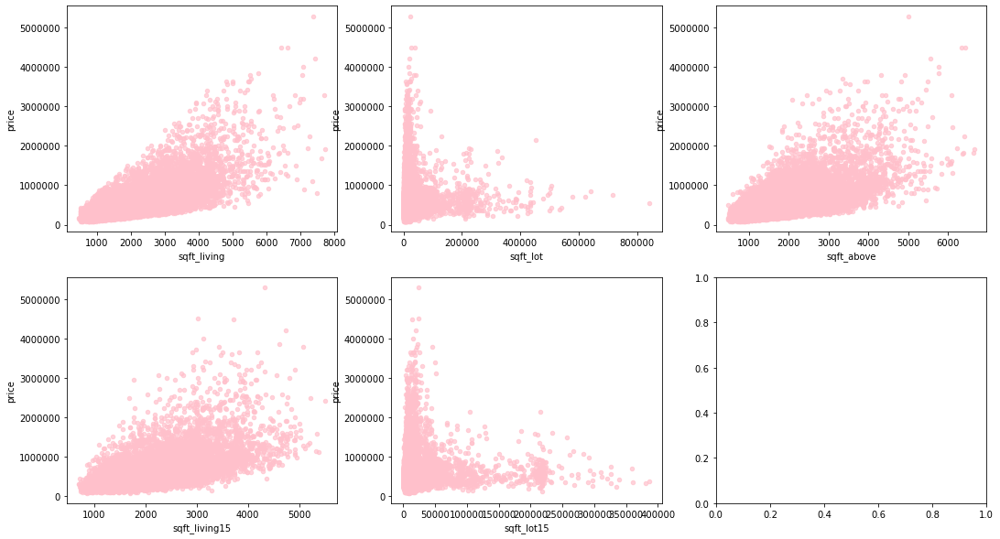

In [13]:
# Visually reinspect data. Should look much better

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18,10))

for xcol, ax in zip(cont, axes.flatten()):
    df.plot(kind='scatter', x=xcol, y='price', ax=ax, alpha=0.7, color='pink')

In [14]:
# Dummify the categorical variables

cat_pre_list = ['bdrm', 'bath', 'flrs', 'cond', 'grade', 'built']

dummies = pd.get_dummies(df[cat], prefix=cat_pre_list, columns=cat, drop_first=True)
geo_dummies = pd.get_dummies(df['geohash'], prefix='geo', columns='geohash', drop_first=True)
geo_dum_list = geo_dummies.columns.to_list()

interim1 = df.drop(cat, axis=1)
interim2 = pd.concat([dummies, geo_dummies], axis=1)
needs_pre = pd.concat([interim1, interim2], axis=1)

needs_pre.shape

(21517, 189)

In [16]:
# Binning dummified variables while dropping outliers:
# Bedrooms above 6
# Bathrooms above 4

bdrm1_2 = needs_pre.filter(['bdrm_2'], axis=1)
bdrm3_4 = needs_pre.filter(['bdrm_3', 'bdrm_4'], axis=1)
bdrm5_6 = needs_pre.filter(['bdrm_5', 'bdrm_6'], axis=1)

bath1 = needs_pre.filter(['bath_0.75', 'bath_1.0', 'bath_1.25', 'bath_1.5', 'bath_1.75'])
bath2 = needs_pre.filter(['bath_2.0', 'bath_2.25', 'bath_2.5', 'bath_2.75'])
bath3 = needs_pre.filter(['bath_3.0', 'bath_3.25', 'bath_3.5', 'bath_3.75'])

flrs1up = needs_pre.filter(['flrs_1.5'])
flrs2up = needs_pre.filter(['flrs_2.0', 'flrs_2.5'])
flrs3up = needs_pre.filter(['flrs_3.0', 'flrs_3.5'])

gr1_5 = needs_pre.filter([ 'grade_4', 'grade_5'])
gr6_10 = needs_pre.filter([ 'grade_6', 'grade_7', 'grade_8', 'grade_9', 'grade_10'])
gr11_15 = needs_pre.filter(['grade_11', 'grade_12'])

b1900_1925 = needs_pre.filter(['built_1901', 'built_1902', 'built_1903', 'built_1904', 'built_1905', 'built_1906',
           'built_1907', 'built_1908', 'built_1909', 'built_1910', 'built_1911', 'built_1912',
           'built_1913', 'built_1914', 'built_1915', 'built_1916', 'built_1917', 'built_1918',
           'built_1919', 'built_1920', 'built_1921', 'built_1922', 'built_1923', 'built_1924',
           'built_1925'], axis=1)
b1926_1950 = needs_pre.filter(['built_1926', 'built_1927', 'built_1928', 'built_1929', 'built_1930', 'built_1931',
           'built_1932', 'built_1933', 'built_1934', 'built_1935', 'built_1936', 'built_1937',
           'built_1938', 'built_1939', 'built_1940', 'built_1941', 'built_1942', 'built_1943',
           'built_1944', 'built_1945', 'built_1946', 'built_1947', 'built_1948', 'built_1949',
           'built_1950'], axis=1)
b1951_1975 = needs_pre.filter(['built_1951', 'built_1952', 'built_1953', 'built_1954', 'built_1955', 'built_1956',
           'built_1957', 'built_1958', 'built_1959', 'built_1960', 'built_1961', 'built_1962',
           'built_1963', 'built_1964', 'built_1965', 'built_1966', 'built_1967', 'built_1968',
           'built_1969', 'built_1970', 'built_1971', 'built_1972', 'built_1973', 'built_1974',
           'built_1975'], axis=1)
b1976_2000 = needs_pre.filter(['built_1976', 'built_1977', 'built_1978', 'built_1979', 'built_1980', 'built_1981',
           'built_1982', 'built_1983', 'built_1984', 'built_1985', 'built_1986', 'built_1987',
           'built_1988', 'built_1989', 'built_1990', 'built_1991', 'built_1992', 'built_1993',
           'built_1994', 'built_1995', 'built_1996', 'built_1997', 'built_1998', 'built_1999',
           'built_2000'], axis=1)
b2001_2015 = needs_pre.filter(['built_2001', 'built_2002', 'built_2003', 'built_2004', 'built_2005', 'built_2006', 
           'built_2007', 'built_2008', 'built_2009', 'built_2010', 'built_2011', 'built_2012',
           'built_2013', 'built_2014', 'built_2015'], axis=1)

bedrooms = ['bdrm1_2', 'bdrm3_4', 'bdrm5_6']
bathrooms = ['bath1_2', 'bath2_3', 'bathover_4']
floors = ['flrs1up', 'flrs2up', 'flrs3up']
grade = ['gr1_5', 'gr6_10', 'gr11_15']
build_yr = ['b1900_1925', 'b1926_1950', 'b1951_1975', 'b1976_2000', 'b2001_2015']

bdrm1_2['bdrm1_2'] = bdrm1_2.sum(axis=1)
bdrm3_4['bdrm3_4'] = bdrm3_4.sum(axis=1)
bdrm5_6['bdrm5_6'] = bdrm5_6.sum(axis=1)
bath1['bath1'] = bath1.sum(axis=1)
bath2['bath2'] = bath2.sum(axis=1)
bath3['bath3'] = bath3.sum(axis=1)
flrs1up['flrs1up'] = flrs1up.sum(axis=1)
flrs2up['flrs2up'] = flrs2up.sum(axis=1)
flrs3up['flrs3up'] = flrs3up.sum(axis=1)
gr1_5['gr1_5'] = gr1_5.sum(axis=1)
gr6_10['gr6_10'] = gr6_10.sum(axis=1)
gr11_15['gr11_15'] = gr11_15.sum(axis=1)
b1900_1925['b1900_1925'] = b1900_1925.sum(axis=1)
b1926_1950['b1926_1950'] = b1926_1950.sum(axis=1)
b1951_1975['b1951_1975'] = b1951_1975.sum(axis=1)
b1976_2000['b1976_2000'] = b1976_2000.sum(axis=1)
b2001_2015['b2001_2015'] = b2001_2015.sum(axis=1)

for_bins = geo_dum_list + ['cond_2', 'cond_3', 'cond_4', 'cond_5']
bins = needs_pre[for_bins]

bins['bdrm1_2'] = bdrm1_2['bdrm1_2']
bins['bdrm3_4'] = bdrm3_4['bdrm3_4']
bins['bdrm5_6'] = bdrm5_6['bdrm5_6']
bins['bath1'] = bath1['bath1']
bins['bath2'] = bath2['bath2']
bins['bath3'] = bath3['bath3']
bins['flrs1up'] = flrs1up['flrs1up']
bins['flrs2up'] = flrs2up['flrs2up']
bins['flrs3up'] = flrs3up['flrs3up']
bins['gr1_5'] = gr1_5['gr1_5']
bins['gr6_10'] = gr6_10['gr6_10']
bins['gr11_15'] = gr11_15['gr11_15']
bins['b1900_1925'] = b1900_1925['b1900_1925']
bins['b1926_1950'] = b1926_1950['b1926_1950']
bins['b1951_1975'] = b1951_1975['b1951_1975']
bins['b1976_2000'] = b1976_2000['b1976_2000']
bins['b2001_2015'] = b2001_2015['b2001_2015']
bins['grade'] = df['grade']

bins.shape

C:\Users\Wolfgang Wallach\anaconda3\envs\learn-env\lib\site-packages\ipykernel_launcher.py:72: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Wolfgang Wallach\anaconda3\envs\learn-env\lib\site-packages\ipykernel_launcher.py:73: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Wolfgang Wallach\anaconda3\envs\learn-env\lib\site-packages\ipykernel_launcher.py:74: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = va

(21517, 35)

In [17]:
# Check for multicollinearity

multicorr = needs_pre[cont].corr().abs().stack().reset_index().sort_values(0, ascending=False)
multicorr['pairs'] = list(zip(multicorr.level_0, multicorr.level_1))
multicorr.set_index(['pairs'], inplace=True)
multicorr.drop(['level_1', 'level_0'], axis=1, inplace=True)
multicorr.columns= ['cc']
multicorr.drop_duplicates(inplace=True)
multicorr[(multicorr.cc>.75) & (multicorr.cc<1)]

,cc
pairs,
"(sqft_living, sqft_above)",0.872265
"(sqft_lot, sqft_lot15)",0.775344
"(sqft_living, sqft_living15)",0.758780


In [18]:
# I hate to drop more than half my continuous variables, but that's what I need to do. I could
# maintain three of the five, but I have a hunch that sqft_living is going to be more important
# than either of the '15' columns, so I'll hold onto that one.

try:
    needs_pre.drop(['sqft_above', 'sqft_living15', 'sqft_lot15'], axis=1, inplace=True)
except:
    pass

display(needs_pre.shape) # Should be three less than above

(21517, 186)

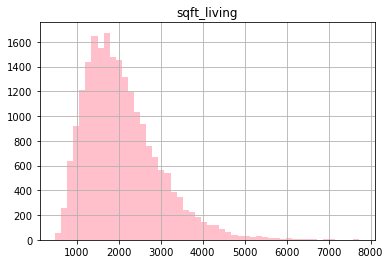

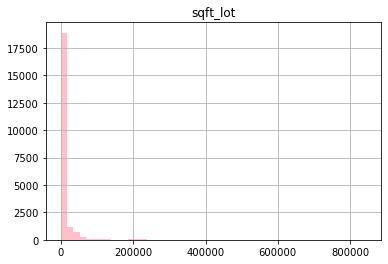

In [19]:
# Check for normality of variables, then of residuals

for column in ['sqft_living', 'sqft_lot']:
    needs_pre.hist(column=column, bins=50, color='pink')

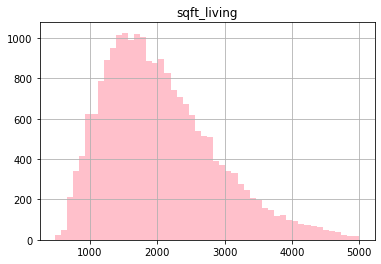

In [20]:
# Dropping sqft_lot, as well as some more extreme values from sqft_living

interim_df = needs_pre.filter(['price','sqft_living'], axis=1)
interim_df2 = pd.concat([interim_df, bins], axis = 1)

q = """SELECT *
       FROM interim_df2
       WHERE sqft_living <= 5000"""

interim_df4 = pysqldf(q)

interim_df4.hist(column='sqft_living', bins=50, color='pink');

In [23]:
q = """SELECT *
       FROM interim_df4
       WHERE price < 1000000"""

later_graph_df = pysqldf(q)

interim_df3 = later_graph_df.drop(['grade'], axis=1)

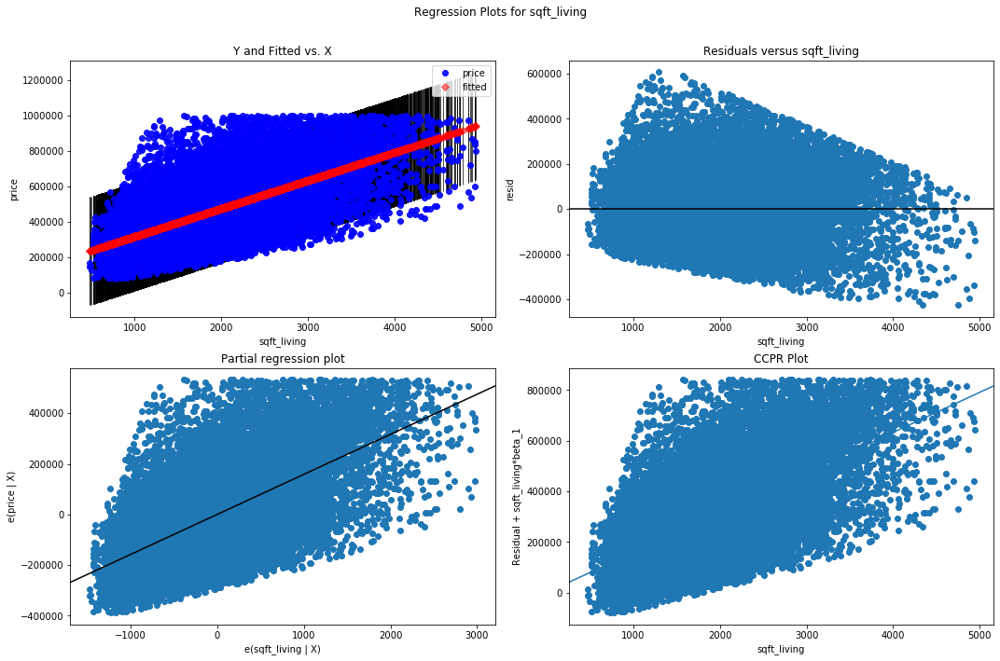

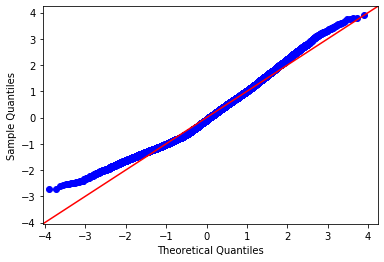

In [24]:
def analyze(df, column):
    f = f'price~{column}'
    model = ols(formula=f, data=df).fit()
    
    fig = plt.figure(figsize=(15,10))
    fig = sm.graphics.plot_regress_exog(model, column, fig=fig)
    
    resid = model.resid
    figq = sm.graphics.qqplot(resid, line='45', fit=True)
    
    return model, fig, figq

living_model, living_errors, livingqq = analyze(interim_df3, 'sqft_living')

In [25]:
# As I feared, sqft_living is not homoscedestatic, nor are its residuals normally distributed

living_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.363
Model:                            OLS   Adj. R-squared:                  0.363
Method:                 Least Squares   F-statistic:                 1.139e+04
Date:                Tue, 26 Jan 2021   Prob (F-statistic):               0.00
Time:                        01:43:50   Log-Likelihood:            -2.6785e+05
No. Observations:               20027   AIC:                         5.357e+05
Df Residuals:                   20025   BIC:                         5.357e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept     1.58e+05   3095.784     51.036      0.000    1.52e+05    1.64e+05
sqft_living   158.2986      1.483    106.724      0.000     155.391     161.206
==============================================================================
Omnibus:                      671.227   Durbin-Watson:                   1.961
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              739.522
Skew:                           0.469   Prob(JB):                    2.60e-161
Kurtosis:                       2.926   Cond. No.                     5.87e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.87e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.340
Model:                            OLS   Adj. R-squared:                  0.340
Method:                 Least Squares   F-statistic:                 1.033e+04
Date:                Tue, 26 Jan 2021   Prob (F-statistic):               0.00
Time:                        01:43:53   Log-Likelihood:            -2.6820e+05
No. Observations:               20027   AIC:                         5.364e+05
Df Residuals:                   20025   BIC:                         5.364e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept       -1.731e+06   2.17e+04    -79.942      0.000   -1.77e+06   -1.69e+06
log_sqft_living  2.929e+05   2881.909    101.638      0.000    2.87e+05    2.99e+05
==============================================================================
Omnibus:                      654.529   Durbin-Watson:                   1.959
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              677.132
Skew:                           0.427   Prob(JB):                    9.18e-148
Kurtosis:                       2.713   Cond. No.                         148.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

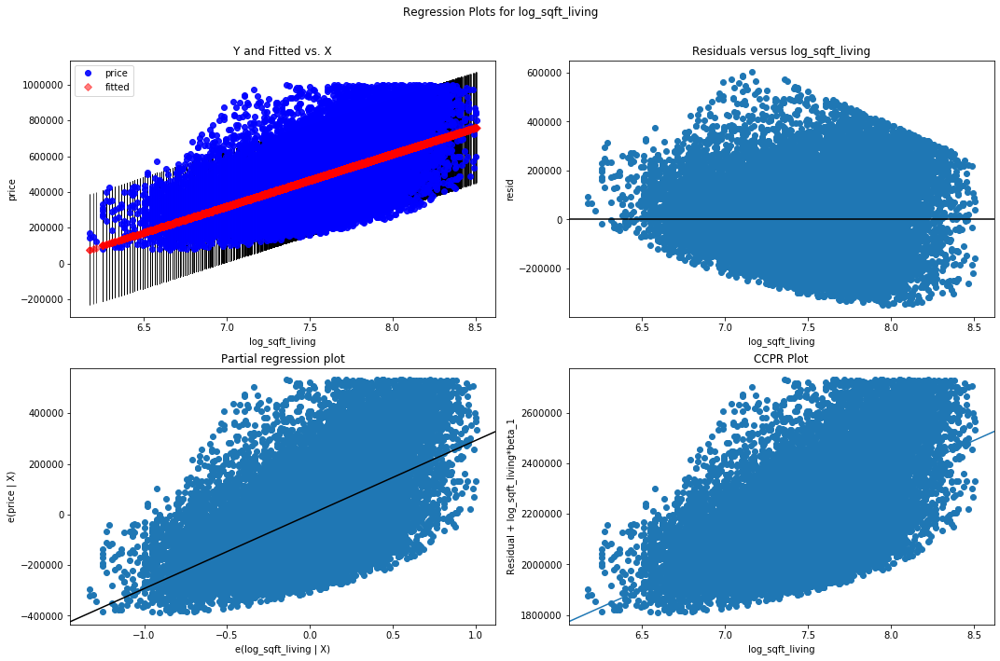

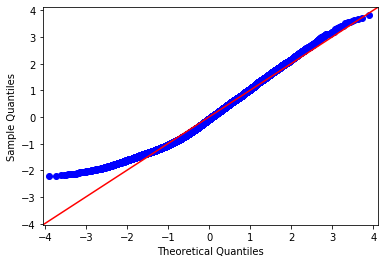

In [26]:
log_test = interim_df3.filter(['price', 'sqft_living'], axis=1)

log_test['log_sqft_living'] = log_test['sqft_living'].map(lambda x: np.log(x))   

log_living_model, log_living_errors, log_livingqq = analyze(log_test, 'log_sqft_living')
    
f2 = 'price~log_sqft_living'
model = ols(formula=f2, data=log_test).fit()
model.summary()

In [29]:
# While not that much better, I am still going to hold onto the log_sqft_living value, so I can
# have a single continuous value.

sqft_liv_log = log_test['log_sqft_living']
scaled_sqft_liv_log = (sqft_liv_log - min(sqft_liv_log))/(max(sqft_liv_log)-min(sqft_liv_log))
log_test['scaled_sqft_living'] = scaled_sqft_liv_log
log_test2 = log_test.drop(['sqft_living', 'log_sqft_living'], axis=1)
interim_df4 = interim_df3.drop(['price', 'sqft_living'], axis=1)
preprocessed = pd.concat([log_test2, interim_df4], axis=1)
preprocessed.head()

,price,scaled_sqft_living,geo_c22v,geo_c22y,geo_c22z,geo_c23h,geo_c23j,geo_c23k,geo_c23m,geo_c23n,...,flrs2up,flrs3up,gr1_5,gr6_10,gr11_15,b1900_1925,b1926_1950,b1951_1975,b1976_2000,b2001_2015
0,221900.0,0.385823,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,0,0
1,538000.0,0.719706,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,1,0,0
2,180000.0,0.202718,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
3,604000.0,0.603480,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
4,510000.0,0.537359,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,1,0


In [30]:
col_list = preprocessed.columns.tolist()
col_list.remove('price')

output = 'price'
mod_in = '+'.join(col_list)
f3 = output + '~' + mod_in
model = ols(formula=f3, data=preprocessed).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.605
Model:                            OLS   Adj. R-squared:                  0.604
Method:                 Least Squares   F-statistic:                     873.4
Date:                Tue, 26 Jan 2021   Prob (F-statistic):               0.00
Time:                        01:44:15   Log-Likelihood:            -2.6307e+05
No. Observations:               20027   AIC:                         5.262e+05
Df Residuals:                   19991   BIC:                         5.265e+05
Df Model:                          35                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept           1.733e+05   1.29e+05      1.341      0.180      -8e+04    4.27e+05
scaled_sqft_living  7.266e+05   7778.919     93.408      0.000    7.11e+05    7.42e+05
geo_c22v            5.622e+04   2.79e+04      2.013      0.044    1487.937    1.11e+05
geo_c22y            2.075e+05   2.77e+04      7.502      0.000    1.53e+05    2.62e+05
geo_c22z            2.887e+05   2.76e+04     10.445      0.000    2.35e+05    3.43e+05
geo_c23h             1.69e+04   2.81e+04      0.603      0.547   -3.81e+04    7.19e+04
geo_c23j            3.213e+04   2.75e+04      1.167      0.243   -2.18e+04    8.61e+04
geo_c23k            3.017e+04   3.07e+04      0.983      0.326      -3e+04    9.03e+04
geo_c23m             1.25e+05   2.98e+04      4.197      0.000    6.66e+04    1.83e+05
geo_c23n            2.098e+05   2.75e+04      7.627      0.000    1.56e+05    2.64e+05
geo_c23p            2.435e+05   2.75e+04      8.847      0.000     1.9e+05    2.97e+05
geo_c23q            1.739e+05   2.79e+04      6.244      0.000    1.19e+05    2.29e+05
geo_c23r            1.281e+05   2.84e+04      4.519      0.000    7.25e+04    1.84e+05
geo_c23t            1.948e+05   1.26e+05      1.549      0.121   -5.17e+04    4.41e+05
geo_c23x            5.216e+04   4.13e+04      1.263      0.207   -2.88e+04    1.33e+05
cond_2              1.637e+04   2.52e+04      0.649      0.516    -3.3e+04    6.58e+04
cond_3              5.742e+04   2.34e+04      2.450      0.014    1.15e+04    1.03e+05
cond_4              8.441e+04   2.34e+04      3.600      0.000    3.84e+04     1.3e+05
cond_5              9.779e+04   2.36e+04      4.144      0.000    5.15e+04    1.44e+05
bdrm1_2              418.0161   8637.887      0.048      0.961   -1.65e+04    1.73e+04
bdrm3_4            -3.527e+04   8561.042     -4.120      0.000   -5.21e+04   -1.85e+04
bdrm5_6            -7.321e+04   9237.076     -7.926      0.000   -9.13e+04   -5.51e+04
bath1              -4.212e+04   1.11e+04     -3.780      0.000    -6.4e+04   -2.03e+04
bath2              -3.663e+04   1.08e+04     -3.381      0.001   -5.79e+04   -1.54e+04
bath3              -2105.5671   1.11e+04     -0.190      0.849   -2.38e+04    1.96e+04
flrs1up             1.166e+04   3485.377      3.345      0.001    4828.155    1.85e+04
flrs2up             3.129e+04   2693.832     11.615      0.000     2.6e+04    3.66e+04
flrs3up             3.455e+04   6128.547      5.638      0.000    2.25e+04    4.66e+04
gr1_5              -2.648e+05   1.23e+05     -2.146      0.032   -5.07e+05   -2.29e+04
gr6_10             -2.467e+05   1.23e+05     -2.002      0.045   -4.88e+05   -5105.870
gr11_15            -8.462e+04   1.24e+05     -0.682      0.495   -3.28e+05    1.59e+05
b1900_1925         -8851.9582   1.41e+04     -0.626      0.531   -3.66e+04    1.89e+04
b1926_1950         -5.451e+04   1.41e+

In [31]:
%%time

linreg = LinearRegression()
rsquared = 0
namount = 0
final = pd.DataFrame()

if preprocessed.shape[1] < 50:
    for n in range(10, (preprocessed.shape[1]+1)):
        selector = RFE(linreg, n_features_to_select=n)
        selector = selector.fit(preprocessed, preprocessed['price'])
        
        to_keep = pd.DataFrame()
        col_bool = selector.support_
        col_names = preprocessed.columns.tolist()
    
        to_keep['bool'] = col_bool
        to_keep['columns'] = col_names
    
        q = """SELECT *
               FROM to_keep
               WHERE bool is True"""
    
        kept = pysqldf(q)
        col_to_keep = kept['columns'].tolist()
    
        trial_df = preprocessed[col_to_keep]
    
        col_list = trial_df.drop(columns=['price'], axis=1).columns.tolist()
        output = 'price'
        mod_in = '+'.join(col_list)
        f3 = output + '~' + mod_in
        model = ols(formula=f3, data=trial_df).fit()
        if model.rsquared_adj >= rsquared:
            rsquared = model.rsquared_adj
            namount = n
            final = trial_df
        else:
            pass
else:
    for n in range(preprocessed.shape[1]-10, preprocessed.shape[1]+1):
        selector = RFE(linreg, n_features_to_select=n)
        selector = selector.fit(preprocessed, preprocessed['price'])
        
        to_keep = pd.DataFrame()
        col_bool = selector.support_
        col_names = preprocessed.columns.tolist()
    
        to_keep['bool'] = col_bool
        to_keep['columns'] = col_names
    
        q = """SELECT *
               FROM to_keep
               WHERE bool is True"""
    
        kept = pysqldf(q)
        col_to_keep = kept['columns'].tolist()

        trial_df = preprocessed[col_to_keep]

        col_list = trial_df.drop(columns=['price'], axis=1).columns.tolist()
        output = 'price'
        mod_in = '+'.join(col_list)
        f3 = output + '~' + mod_in
        model = ols(formula=f3, data=trial_df).fit()
        if model.rsquared_adj >= rsquared:
            rsquared = model.rsquared_adj
            namount = n
            final = trial_df
        else:
            pass
    
print(namount)
print(rsquared)
final.head()

36
0.6039239146139246
Wall time: 5.13 s


,price,scaled_sqft_living,geo_c22v,geo_c22y,geo_c22z,geo_c23h,geo_c23j,geo_c23k,geo_c23m,geo_c23n,...,flrs2up,flrs3up,gr1_5,gr6_10,gr11_15,b1900_1925,b1926_1950,b1951_1975,b1976_2000,b2001_2015
0,221900.0,0.385823,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,0,0
1,538000.0,0.719706,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,1,0,0
2,180000.0,0.202718,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
3,604000.0,0.603480,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
4,510000.0,0.537359,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,1,0


In [32]:
# Since the r-squared doesn't change, I am going to use the greatest amount of features with
# the highest r-squared, which in this case is all of them
X = final[['price']]
y = final.drop(['price'], axis=1)

cv_5_results  = np.mean(cross_val_score(linreg, X, y, cv=5,  scoring='neg_mean_squared_error'))
cv_10_results = np.mean(cross_val_score(linreg, X, y, cv=10, scoring='neg_mean_squared_error'))
cv_20_results = np.mean(cross_val_score(linreg, X, y, cv=20, scoring='neg_mean_squared_error'))

print(cv_5_results)
print(cv_10_results)
print(cv_20_results)

-0.09481485903071549
-0.09479701500731194
-0.09439261520480136


In [33]:
col_list = final.drop(columns=['price'], axis=1).columns.tolist()
output = 'price'
mod_in = '+'.join(col_list)
ff = output + '~' + mod_in
model = ols(formula=ff, data=final).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.605
Model:                            OLS   Adj. R-squared:                  0.604
Method:                 Least Squares   F-statistic:                     873.4
Date:                Tue, 26 Jan 2021   Prob (F-statistic):               0.00
Time:                        01:44:23   Log-Likelihood:            -2.6307e+05
No. Observations:               20027   AIC:                         5.262e+05
Df Residuals:                   19991   BIC:                         5.265e+05
Df Model:                          35                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept           1.733e+05   1.29e+05      1.341      0.180      -8e+04    4.27e+05
scaled_sqft_living  7.266e+05   7778.919     93.408      0.000    7.11e+05    7.42e+05
geo_c22v            5.622e+04   2.79e+04      2.013      0.044    1487.937    1.11e+05
geo_c22y            2.075e+05   2.77e+04      7.502      0.000    1.53e+05    2.62e+05
geo_c22z            2.887e+05   2.76e+04     10.445      0.000    2.35e+05    3.43e+05
geo_c23h             1.69e+04   2.81e+04      0.603      0.547   -3.81e+04    7.19e+04
geo_c23j            3.213e+04   2.75e+04      1.167      0.243   -2.18e+04    8.61e+04
geo_c23k            3.017e+04   3.07e+04      0.983      0.326      -3e+04    9.03e+04
geo_c23m             1.25e+05   2.98e+04      4.197      0.000    6.66e+04    1.83e+05
geo_c23n            2.098e+05   2.75e+04      7.627      0.000    1.56e+05    2.64e+05
geo_c23p            2.435e+05   2.75e+04      8.847      0.000     1.9e+05    2.97e+05
geo_c23q            1.739e+05   2.79e+04      6.244      0.000    1.19e+05    2.29e+05
geo_c23r            1.281e+05   2.84e+04      4.519      0.000    7.25e+04    1.84e+05
geo_c23t            1.948e+05   1.26e+05      1.549      0.121   -5.17e+04    4.41e+05
geo_c23x            5.216e+04   4.13e+04      1.263      0.207   -2.88e+04    1.33e+05
cond_2              1.637e+04   2.52e+04      0.649      0.516    -3.3e+04    6.58e+04
cond_3              5.742e+04   2.34e+04      2.450      0.014    1.15e+04    1.03e+05
cond_4              8.441e+04   2.34e+04      3.600      0.000    3.84e+04     1.3e+05
cond_5              9.779e+04   2.36e+04      4.144      0.000    5.15e+04    1.44e+05
bdrm1_2              418.0161   8637.887      0.048      0.961   -1.65e+04    1.73e+04
bdrm3_4            -3.527e+04   8561.042     -4.120      0.000   -5.21e+04   -1.85e+04
bdrm5_6            -7.321e+04   9237.076     -7.926      0.000   -9.13e+04   -5.51e+04
bath1              -4.212e+04   1.11e+04     -3.780      0.000    -6.4e+04   -2.03e+04
bath2              -3.663e+04   1.08e+04     -3.381      0.001   -5.79e+04   -1.54e+04
bath3              -2105.5671   1.11e+04     -0.190      0.849   -2.38e+04    1.96e+04
flrs1up             1.166e+04   3485.377      3.345      0.001    4828.155    1.85e+04
flrs2up             3.129e+04   2693.832     11.615      0.000     2.6e+04    3.66e+04
flrs3up             3.455e+04   6128.547      5.638      0.000    2.25e+04    4.66e+04
gr1_5              -2.648e+05   1.23e+05     -2.146      0.032   -5.07e+05   -2.29e+04
gr6_10             -2.467e+05   1.23e+05     -2.002      0.045   -4.88e+05   -5105.870
gr11_15            -8.462e+04   1.24e+05     -0.682      0.495   -3.28e+05    1.59e+05
b1900_1925         -8851.9582   1.41e+04     -0.626      0.531   -3.66e+04    1.89e+04
b1926_1950         -5.451e+04   1.41e+

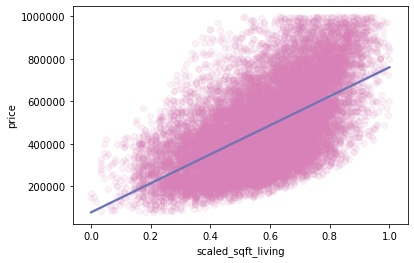

In [48]:
# plt.figure(figsize=(13,8))
# fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15,15), sharey=True)

sns.regplot(x='scaled_sqft_living', y='price', data=final, scatter_kws={'alpha':0.1,
                                                                        'color':'#d881b8'},
           line_kws={'color': '#6d75b6'})
# axes[0,0].set_title('sqft_living vs price', size=12)

# sns.regplot(x=bedrooms, y='price', data=final, scatter_kws={'alpha':0.3,
#                                                                         'color':'#FF96EE'},
#            line_kws={'color': '#9C33FF'}, ax=axes[0,1])
# axes[0,1].set_title('bedrooms vs price', size=12)

# sns.regplot(x=bathrooms, y='price', data=final, scatter_kws={'alpha':0.3,
#                                                                         'color':'#FF96EE'},
#            line_kws={'color': '#9C33FF'}, ax=axes[1,0])
# axes[1,0].set_title('bathrooms vs price', size=12)

# sns.regplot(x=floors, y='price', data=final, scatter_kws={'alpha':0.3,
#                                                                         'color':'#FF96EE'},
#            line_kws={'color': '#9C33FF'}, ax=axes[1,1])
# axes[1,1].set_title('floors vs price', size=12)

# sns.regplot(x=grade, y='price', data=final, scatter_kws={'alpha':0.3,
#                                                                         'color':'#FF96EE'},
#            line_kws={'color': '#9C33FF'}, ax=axes[2,0])
# axes[2,0].set_title('grade vs price', size=12)

# sns.regplot(x=build_yr, y='price', data=final, scatter_kws={'alpha':0.3,
#                                                                         'color':'#FF96EE'},
#            line_kws={'color': '#9C33FF'}, ax=axes[2,1])
# axes[2,1].set_title('year built vs price', size=12)

plt.show();

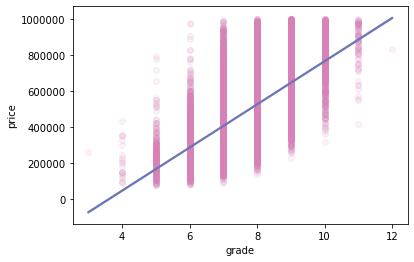

In [49]:
sns.regplot(x='grade', y='price', data=later_graph_df,
            scatter_kws={'alpha':0.1, 'color':'#d881b8'},
            line_kws={'color': '#6d75b6'})
plt.show();